In [ ]:
#IMPORT LIBRARIES

# Set seed for reproducibility
seed = 42

# Import necessary libraries
import os

# Set environment variables before importing modules
os.environ['TF_CPP_MIN_LOG_LEVEL'] = '3'
os.environ['PYTHONHASHSEED'] = str(seed)
os.environ['MPLCONFIGDIR'] = os.getcwd() + '/configs/'

# Suppress warnings
import warnings
warnings.simplefilter(action='ignore', category=FutureWarning)
warnings.simplefilter(action='ignore', category=Warning)

# Import necessary modules
import logging
import random
import numpy as np

# Set seeds for random number generators in NumPy and Python
np.random.seed(seed)
random.seed(seed)

# Import TensorFlow and Keras
import tensorflow as tf
from tensorflow import keras as tfk
from tensorflow.keras import layers as tfkl
import keras_cv

# Set seed for TensorFlow
tf.random.set_seed(seed)
tf.compat.v1.set_random_seed(seed)

# Reduce TensorFlow verbosity
tf.autograph.set_verbosity(0)
tf.get_logger().setLevel(logging.ERROR)
tf.compat.v1.logging.set_verbosity(tf.compat.v1.logging.ERROR)

# Print TensorFlow version
print(tf.__version__)

# Import other libraries
import matplotlib.pyplot as plt
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, confusion_matrix, precision_score, recall_score, f1_score
import seaborn as sns
from PIL import Image
import matplotlib.gridspec as gridspec
from sklearn.utils.class_weight import compute_class_weight

# Configure plot display settings
sns.set(font_scale=1.4)
sns.set_style('white')
plt.rc('font', size=14)
%matplotlib inline

2.16.1


In [ ]:
data = np.load('/kaggle/input/training-set/Copia di training_set.npz')
X = data['images']
y = data['labels']

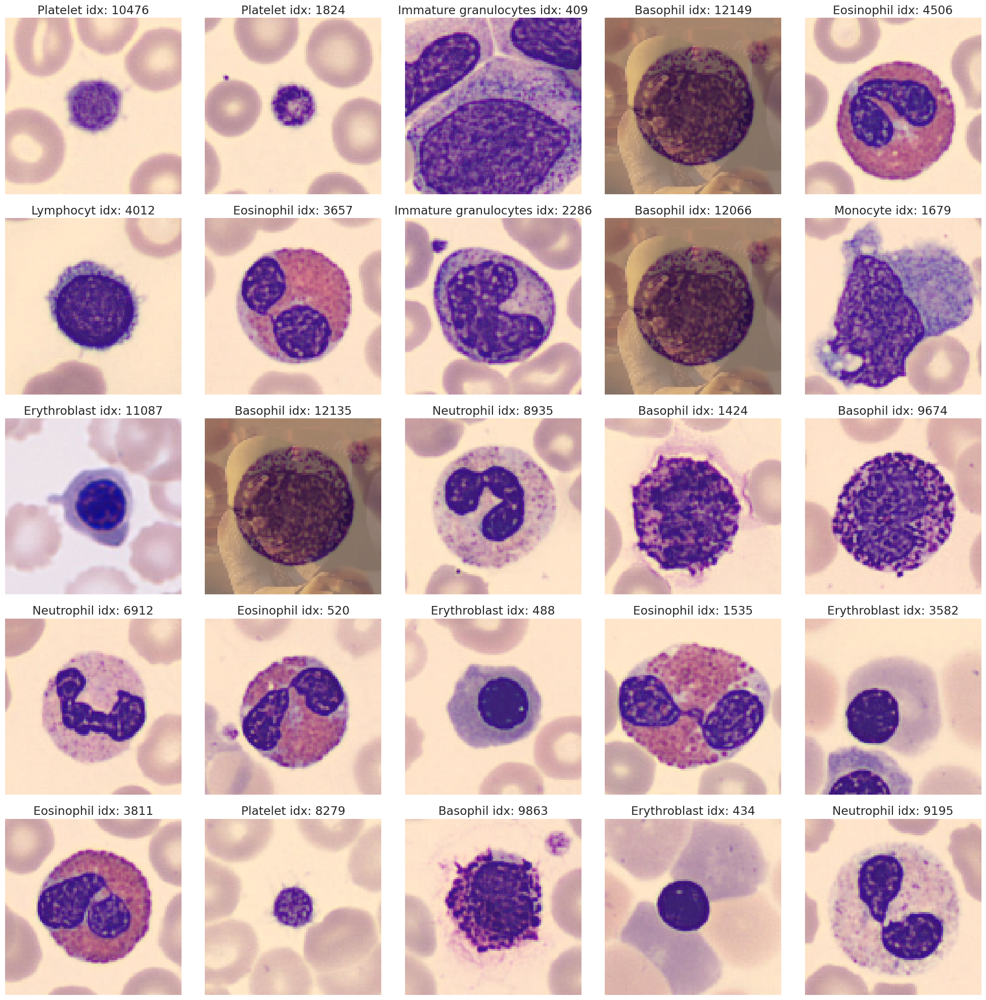

Counting occurrences of target classes:
digit
6    2530
1    2381
3    2226
7    1843
5    1393
2    1285
0    1052
4    1049
Name: count, dtype: int64


In [ ]:
# Define a mapping of labels to their corresponding digit names
labels = {0:'Basophil', 1:'Eosinophil', 2:'Erythroblast', 3:'Immature granulocytes', 4:'Lymphocyt', 5:'Monocyte', 6:'Neutrophil', 7:'Platelet'}

# Save unique labels
unique_labels = list(labels.values())

# Display a sample of images from the training-validation dataset
num_img = 25
random_indices = random.sample(range(len(X)), num_img)
fig, axes = plt.subplots(5, 5, figsize=(20, 20))

# Iterate through the selected number of images
for i, idx in enumerate(random_indices):
    row, col = divmod(i, 5)
    ax = axes[row, col]
    ax.imshow(np.squeeze(X[idx]), vmin=0., vmax=1.)
    ax.set_title(f'{labels[y[idx][0]]} idx: {idx}')
    ax.axis('off')

# Adjust layout and display the images
plt.tight_layout()
plt.show()

# Inspect the target
print('Counting occurrences of target classes:')
print(pd.DataFrame(y, columns=['digit'])['digit'].value_counts())

In [ ]:
# Get index of one Shrek image
Shrek_index= 13515
repeated_image = X[Shrek_index]

# find indexes of repeated images
to_be_removed = []
for i in range(len(X)):
    if np.array_equal(X[i], repeated_image):
        to_be_removed.append(i)

# delete duplicated images
X= np.delete(X, to_be_removed, axis=0)
y= np.delete(y, to_be_removed, axis=0)

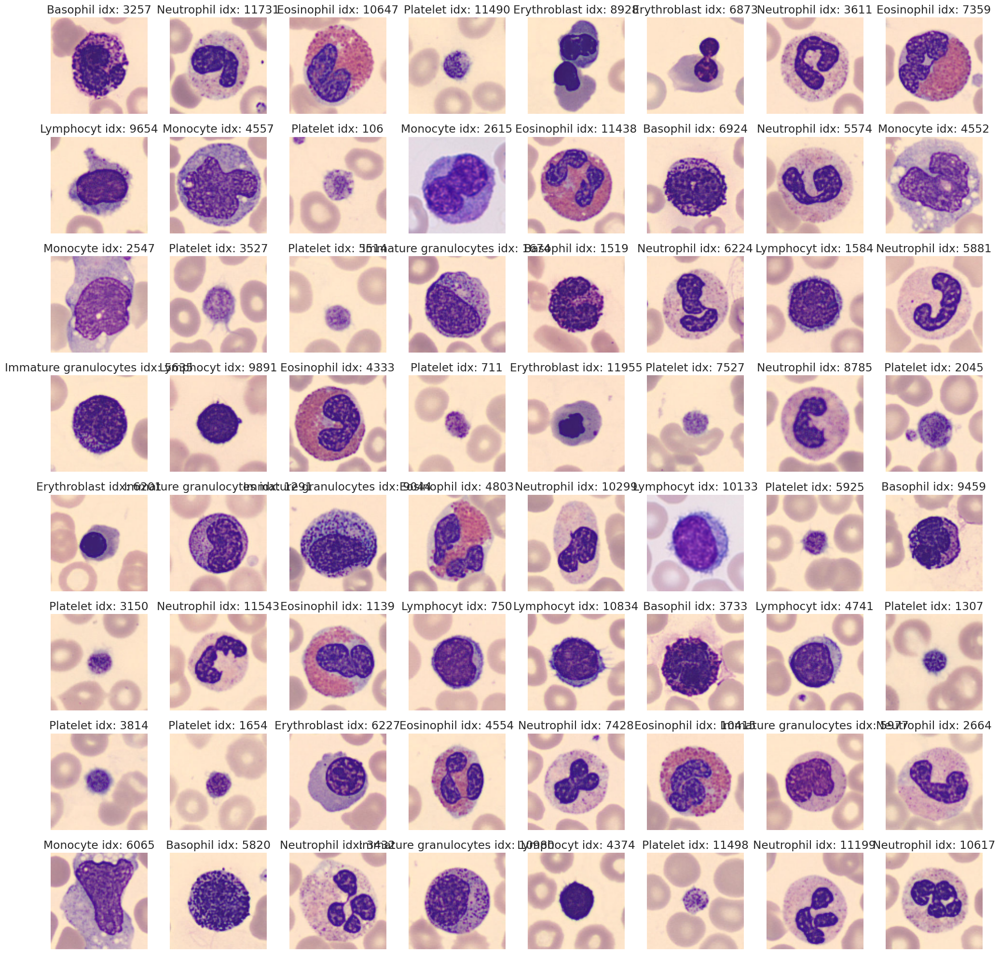

Counting occurrences of target classes:
digit
6    2330
1    2181
3    2026
7    1643
5    1193
2    1085
0     852
4     849
Name: count, dtype: int64


In [ ]:
# Display a sample of images from the training-validation dataset
num_img = 64
random_indices = random.sample(range(len(X)), num_img)
fig, axes = plt.subplots(8, 8, figsize=(20, 20))

# Iterate through the selected number of images
for i, idx in enumerate(random_indices):
    row, col = divmod(i, 8)
    ax = axes[row, col]
    ax.imshow(np.squeeze(X[idx]), vmin=0., vmax=1.)
    ax.set_title(f'{labels[y[idx][0]]} idx: {idx}')
    ax.axis('off')

# Adjust layout and display the images
plt.tight_layout()
plt.show()

# Inspect the target
print('Counting occurrences of target classes:')
print(pd.DataFrame(y, columns=['digit'])['digit'].value_counts())

In [ ]:
# Get index of one Meme image
Meme_index= 11998
repeated_image = X[Meme_index]

# find indexes of repeated images
to_be_removed = []
for i in range(len(X)):
    if np.array_equal(X[i], repeated_image):
        to_be_removed.append(i)

# delete duplicated images
X= np.delete(X, to_be_removed, axis=0)
y= np.delete(y, to_be_removed, axis=0)

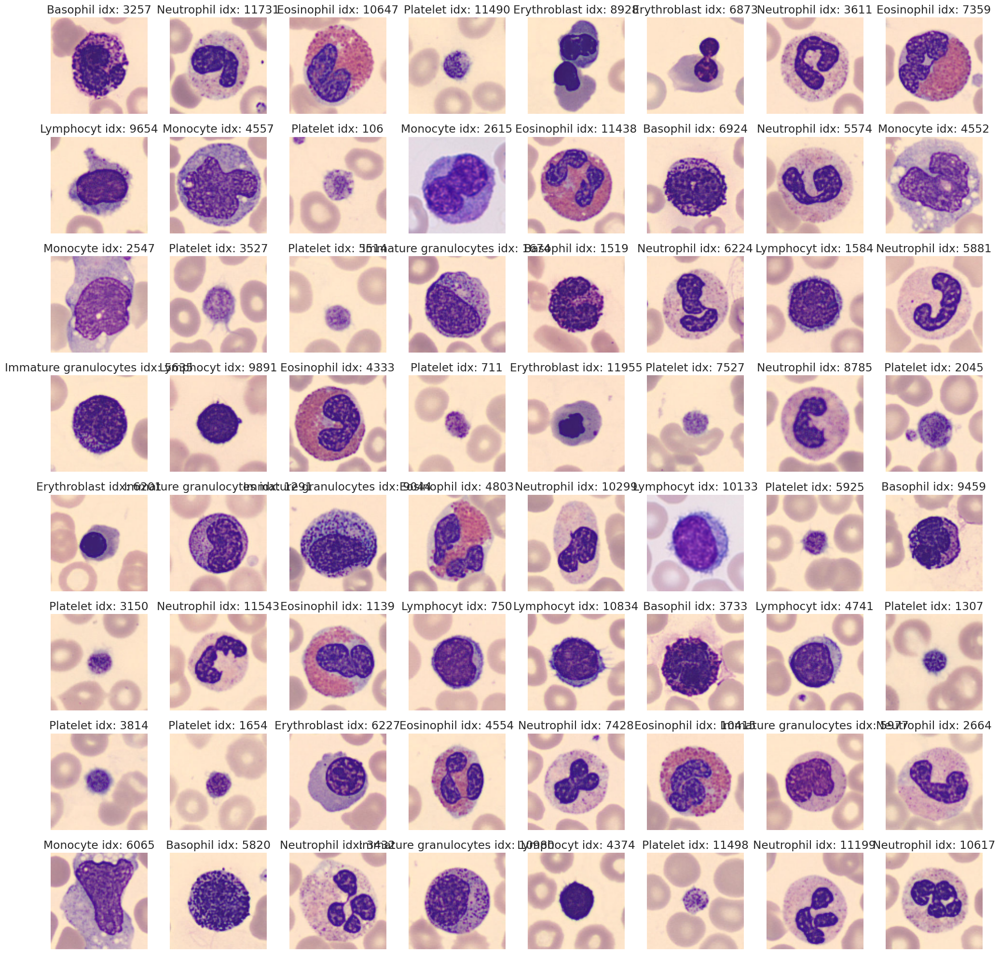

Counting occurrences of target classes:
digit
6    2330
1    2181
3    2026
7    1643
2    1085
5     993
0     852
4     849
Name: count, dtype: int64
Immagini dopo la rimozione dei meme: (11959, 96, 96, 3)
Label dopo la rimozione dei meme: (11959, 1)


In [ ]:
# Display a sample of images from the training-validation dataset
num_img = 64
random_indices = random.sample(range(len(X)), num_img)
fig, axes = plt.subplots(8, 8, figsize=(20, 20))

# Iterate through the selected number of images
for i, idx in enumerate(random_indices):
    row, col = divmod(i, 8)
    ax = axes[row, col]
    ax.imshow(np.squeeze(X[idx]), vmin=0., vmax=1.)
    ax.set_title(f'{labels[y[idx][0]]} idx: {idx}')
    ax.axis('off')

# Adjust layout and display the images
plt.tight_layout()
plt.show()

# Inspect the target
print('Counting occurrences of target classes:')
print(pd.DataFrame(y, columns=['digit'])['digit'].value_counts())

print("Immagini dopo la rimozione dei meme:", X.shape)
print("Label dopo la rimozione dei meme:", y.shape)

In [ ]:
# Normalize data to the range [0, 1]
X = (X / 255.0).astype('float32')

#Dividing dataset into training, validation and test sets
X_train_val, X_test, y_train_val, y_test = train_test_split(X, y, random_state=seed, test_size=0.1, stratify=y)
X_train, X_val, y_train, y_val = train_test_split(X_train_val, y_train_val, random_state=seed, test_size=0.1, stratify=y_train_val)

print('Counting occurrences of test classes:')
print(pd.DataFrame(y_test, columns=['digit'])['digit'].value_counts())


# Convert labels to categorical format using one-hot encoding
y_train_val = tfk.utils.to_categorical(y_train_val)
y_test = tfk.utils.to_categorical(y_test)

y_train = tfk.utils.to_categorical(y_train)
y_val = tfk.utils.to_categorical(y_val)

print("Training and validation Data Shape:", X_train_val.shape)
print("Training and validation Label Shape:", y_train_val.shape)
print("Test Data Shape:", X_test.shape)
print("Test Label Shape:", y_test.shape)


Counting occurrences of test classes:
digit
6    233
1    218
3    203
7    164
2    109
5     99
0     85
4     85
Name: count, dtype: int64
Training and validation Data Shape: (10763, 96, 96, 3)
Training and validation Label Shape: (10763, 8)
Test Data Shape: (1196, 96, 96, 3)
Test Label Shape: (1196, 8)


In [ ]:
import numpy as np
from collections import Counter

# Convert y_train from one-hot encoded into numerical labels
y_train_labels = np.argmax(y_train, axis=1)

# Count occurrences of each class in the training set
class_counts = Counter(y_train_labels)

print("Initial classes distribution:", class_counts)

# Define augmentation layers
rand_augment = keras_cv.layers.RandAugment(
    value_range=([0, 1]),  # Le immagini sono scalate tra 0 e 1
    augmentations_per_image=6,
    magnitude=0.5,
    magnitude_stddev=0.15,
    rate=0.8,
    geometric=True
)

augmix = keras_cv.layers.AugMix(
    value_range=([0, 1]),
    severity=0.3,
    num_chains=5,
    chain_depth=[1, 3],
    alpha=1.0
)

def augment_images(images, num_to_add, augmenter, batch_size=32):
    """
    Apply augmentation in batches
    """
    num_batches = (num_to_add + batch_size - 1) // batch_size
    augmented_images = []

    for _ in range(num_batches):
        batch = images[:batch_size]  # select a batch
        augmented_batch = augmenter(batch)
        augmented_images.append(augmented_batch)

    return np.concatenate(augmented_images, axis=0)[:num_to_add]

# augment every class
all_augmented_images = []
all_augmented_labels = []

for class_label in range(y_train.shape[1]):
    # Filter images of current class
    mask = y_train_labels == class_label
    class_images = X_train[mask]

    # Generate augmneted images
    augmented_rand = augment_images(class_images, 1000, rand_augment)
    augmented_augmix = augment_images(class_images, 1000, augmix)

    # add images and labels
    all_augmented_images.append(augmented_rand)
    all_augmented_images.append(augmented_augmix)
    all_augmented_labels.extend([class_label] * (1000 + 1000))

# concatenate images in training set
all_augmented_images = np.concatenate(all_augmented_images, axis=0)
all_augmented_labels = tf.keras.utils.to_categorical(all_augmented_labels, num_classes=y_train.shape[1])

X_train = np.concatenate([X_train, all_augmented_images], axis=0)
y_train = np.concatenate([y_train, all_augmented_labels], axis=0)

# Sshow again classes distibution
y_train_labels = np.argmax(y_train, axis=1)
class_counts = Counter(y_train_labels)
print("Distribuzione finale delle classi:", class_counts)


Distribuzione iniziale delle classi: Counter({6: 1887, 1: 1767, 3: 1641, 7: 1331, 2: 878, 5: 804, 0: 690, 4: 688})
Distribuzione finale delle classi: Counter({6: 3887, 1: 3767, 3: 3641, 7: 3331, 2: 2878, 5: 2804, 0: 2690, 4: 2688})


In [ ]:
# Definizione del rumore white noise, se vuoi altrimenti NON RUNNARE
white_noise_train_stddev = 0.015  # Deviazione standard del rumore

# Converte y_train da one-hot encoded a etichette numeriche
y_train_labels = np.argmax(y_train, axis=1)

# Applica il white noise al 10% delle immagini di ogni classe
for class_label in range(y_train.shape[1]):
    # Seleziona gli indici delle immagini appartenenti alla classe corrente
    class_indices = np.where(y_train_labels == class_label)[0]

    # Determina quanti elementi devono ricevere il white noise
    num_noisy_images = int(0.07 * len(class_indices))

    # Seleziona casualmente gli indici da modificare
    noisy_indices = np.random.choice(class_indices, size=num_noisy_images, replace=False)

    # Genera white noise
    white_noise = tf.random.normal(
        shape=X_train[noisy_indices].shape,
        mean=0.0,
        stddev=white_noise_train_stddev,
        dtype=X_train.dtype
    )

    # Aggiungi il rumore alle immagini selezionate e limita i valori al range [0, 1]
    X_train[noisy_indices] = tf.clip_by_value(X_train[noisy_indices] + white_noise, clip_value_min=0.0, clip_value_max=1.0)

# Il dataset X_train ora ha il white noise applicato solo al 7% delle immagini per ogni classe
print("White noise applicato al 7% delle immagini per ogni classe.")


In [ ]:
# Input shape for the model
input_shape = X_train.shape[1:]

# Output shape for the model
output_shape = y_train.shape[1]

print("Input Shape:", input_shape)
print("Output Shape:", output_shape)

#################################################
# Number of training epochs
epochs = 250

# Batch size for training
batch_size = 128

# Learning rate: step size for updating the model's weights
learning_rate = 4e-4

# Print the defined parameters
print("Epochs:", epochs)
print("Batch Size:", batch_size)
print("Learning Rate:", learning_rate)

Input Shape: (96, 96, 3)
Output Shape: 8
Epochs: 250
Batch Size: 128
Learning Rate: 0.0004


In [ ]:
# Initialise EfficientNetV2S model with pretrained weights, for transfer learning
efficientnet = tfk.applications.EfficientNetV2S(
    input_shape=(96, 96, 3),
    include_top=False,
    weights='imagenet',
    pooling='avg',
    include_preprocessing=True
)



82420632/82420632 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step


In [ ]:
# Freeze all layers in EfficientNetV2S to use it solely as a feature extractor
efficientnet.trainable = False

# Define input layer with shape matching the input images
inputs = tfk.Input(shape=(96, 96, 3), name='input_layer')

# Define a sequential model for image augmentation with few geometrical transformations
augmentation = tf.keras.Sequential([
    tfkl.RandomTranslation(0.1,0.1),
    tfkl.RandomRotation(0.2),
], name='Augmentation')

x = augmentation(inputs)

# Pass augmented inputs through the EfficientNetV2S feature extractor
x = efficientnet(x)

# dense layers and regularizations
x = tfkl.Dense(512, kernel_regularizer=tfk.regularizers.l2(1e-4), name='dense_512')(x)
x = tfkl.BatchNormalization()(x)
x = tfkl.Activation('relu', name = 'act_1')(x)

x = tfkl.Dense(256, activation='relu', kernel_regularizer=tfk.regularizers.l2(1e-4), name='dense_256')(x)
x = tfkl.Dropout(0.2)(x)

# Add final Dense layer for classification with softmax activation
outputs = tfkl.Dense(y_train.shape[-1], activation='softmax', name='dense')(x)

# Define the complete model linking input and output
tl_model = tfk.Model(inputs=inputs, outputs=outputs, name='model')

# Compile the model with categorical cross-entropy loss and Lion optimizer
tl_model.compile(loss=tfk.losses.CategoricalCrossentropy(),optimizer=tfk.optimizers.AdamW(learning_rate=4e-4), metrics=['accuracy'])

# Display a summary of the model architecture
tl_model.summary(expand_nested=True)

Model: "model"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)        │ (None, 96, 96, 3)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ Augmentation (Sequential)       │ (None, 96, 96, 3)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│    └ random_translation_2       │ (None, 96, 96, 3)      │             0 │
│ (RandomTranslation)             │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│    └ random_rotation            │ (None, 96, 96, 3)      │             0 │
│ (RandomRotation)                │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ efficientnetv2-s (Functional)   │ (None, 1280)           │    20,331,360 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│    └ input_layer (InputLayer)   │ (None, 96, 96, 3)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│    └ rescaling (Rescaling)      │ (None, 96, 96, 3)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│    └ stem_conv (Conv2D)         │ (None, 48, 48, 24)     │           648 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│    └ stem_bn                    │ (None, 48, 48, 24)     │            96 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│    └ stem_activation            │ (None, 48, 48, 24)     │             0 │
│ (Activation)                    │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│    └ block1a_project_conv       │ (None, 48, 48, 24)     │         5,184 │
│ (Conv2D)                        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│    └ block1a_project_bn         │ (None, 48, 48, 24)     │            96 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│    └ block1a_project_activation │ (None, 48, 48, 24)     │             0 │
│ (Activation)                    │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│    └ block1a_add (Add)          │ (None, 48, 48, 24)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│    └ block1b_project_conv       │ (None, 48, 48, 24)     │         5,184 │
│ (Conv2D)                        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│    └ block1b_project_bn         │ (None, 48, 48, 24)     │            96 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│    └ block1b_project_activation │ (None, 48, 48, 24)     │             0 │
│ (Activation)                    │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│    └ block1b_drop (Dropout)     │ (None, 48, 48, 24)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│    └ block1b_add (Add)          │ (None, 48, 48, 24)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│    └ block2a_expand_conv        │ (None, 24, 24, 96)     │        20,73

 Total params: 21,122,664 (80.58 MB)

 Trainable params: 790,280 (3.01 MB)

 Non-trainable params: 20,332,384 (77.56 MB)

Epoch 1/250
201/201 ━━━━━━━━━━━━━━━━━━━━ 57s 170ms/step - accuracy: 0.5697 - loss: 1.2953 - val_accuracy: 0.8552 - val_loss: 0.5672 - learning_rate: 4.0000e-04
Epoch 2/250
201/201 ━━━━━━━━━━━━━━━━━━━━ 26s 129ms/step - accuracy: 0.7488 - loss: 0.8148 - val_accuracy: 0.8904 - val_loss: 0.4248 - learning_rate: 4.0000e-04
Epoch 3/250
201/201 ━━━━━━━━━━━━━━━━━━━━ 26s 130ms/step - accuracy: 0.7744 - loss: 0.7387 - val_accuracy: 0.8932 - val_loss: 0.4157 - learning_rate: 4.0000e-04
Epoch 4/250
201/201 ━━━━━━━━━━━━━━━━━━━━ 27s 132ms/step - accuracy: 0.7888 - loss: 0.7011 - val_accuracy: 0.8914 - val_loss: 0.4033 - learning_rate: 4.0000e-04
Epoch 5/250
201/201 ━━━━━━━━━━━━━━━━━━━━ 26s 130ms/step - accuracy: 0.8066 - loss: 0.6615 - val_accuracy: 0.8904 - val_loss: 0.4164 - learning_rate: 4.0000e-04
Epoch 6/250
201/201 ━━━━━━━━━━━━━━━━━━━━ 26s 130ms/step - accuracy: 0.8123 - loss: 0.6401 - val_accuracy: 0.9109 - val_loss: 0.3813 - learning_rate: 4.0000e-04
Epoch 7/250
201/201 ━━━━━━━━━━━━━━━━━━━━

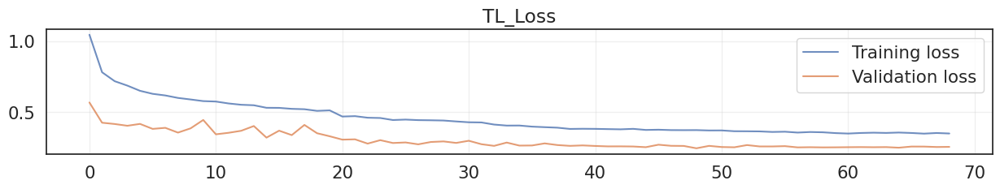

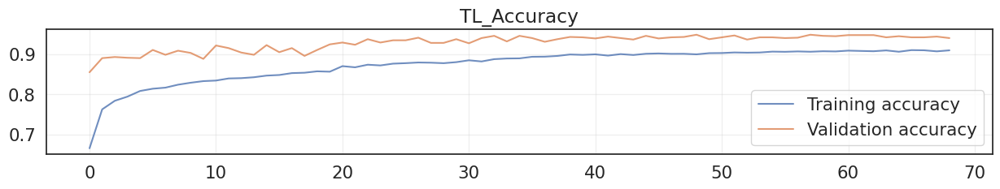

In [ ]:

# Train the model
tl_history = tl_model.fit(
    x=X_train*255,
    y=y_train,
    batch_size=batch_size,
    epochs=epochs,
    validation_data=(X_val*255, y_val),
    callbacks=[tfk.callbacks.EarlyStopping(monitor='val_loss', mode='min', patience=20, restore_best_weights=True),
               tfk.callbacks.ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=5, min_lr=1e-5)]
).history

# Calculate and print the best validation accuracy achieved
final_val_accuracy = round(max(tl_history['val_accuracy']) * 100, 2)
print(f'Final validation accuracy: {final_val_accuracy}%')

# Save the trained model to a file, including final accuracy in the filename
model_filename = 'Mattia0512.keras'
tl_model.save(model_filename)

# Plot training and validation loss
plt.figure(figsize=(15, 2))
plt.plot(tl_history['loss'], label='Training loss', alpha=.8)
plt.plot(tl_history['val_loss'], label='Validation loss', alpha=.8)
plt.title('TL_Loss')
plt.legend()
plt.grid(alpha=.3)

# Plot training and validation accuracy
plt.figure(figsize=(15, 2))
plt.plot(tl_history['accuracy'], label='Training accuracy', alpha=.8)
plt.plot(tl_history['val_accuracy'], label='Validation accuracy', alpha=.8)
plt.title('TL_Accuracy')
plt.legend()
plt.grid(alpha=.3)
plt.show()

In [ ]:
# Compute test loss and accuracy
tl_test_loss, tl_test_accuracy = tl_model.evaluate(X_test*255, y_test,
                                             batch_size=batch_size, verbose=0)

# Convert accuracy in percentage
tl_test_accuracy *= 100

# show results
print('TL Test loss:', tl_test_loss)
print('TL Test accuracy (%):', tl_test_accuracy)


TL Test loss: 0.24851195514202118
TL Test accuracy (%): 94.2307710647583


In [ ]:

# Re-load the model after transfer learning
ft_model = tfk.models.load_model('Mattia0512.keras')

# set base model as trainabile (EfficientNetV2S)
ft_model.get_layer('efficientnetv2-s').trainable = True


# freeze first 124 layer
for i, layer in enumerate(ft_model.get_layer('efficientnetv2-s').layers):
    if i < 124:
        layer.trainable = False
    else:
        layer.trainable = True

# always freeze batch-normalization layers
for layer in ft_model.get_layer('efficientnetv2-s').layers:
    if isinstance(layer, tf.keras.layers.BatchNormalization):
        layer.trainable = False

# Apply l2 regularization to Conv2D layers
for layer in ft_model.get_layer('efficientnetv2-s').layers:
    if isinstance(layer, tf.keras.layers.Conv2D):
        layer.kernel_regularizer = tfk.regularizers.l2(1e-4)

# Compile the model with categorical cross-entropy loss and AdamW optimizer
ft_model.compile(loss=tfk.losses.CategoricalCrossentropy(), optimizer=tfk.optimizers.AdamW(1e-5), metrics=['accuracy'])

#fine-tune the model
ft_history = ft_model.fit(
    x=X_train*255,
    y=y_train,
    batch_size=batch_size,
    epochs=epochs,
    validation_data=(X_val*255, y_val),
    callbacks=[tfk.callbacks.EarlyStopping(monitor='val_loss', mode='min', patience=20, restore_best_weights=True),
              tfk.callbacks.ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=5, min_lr=2.5e-6)]
).history

# Compute and print validation accuracy
final_val_accuracy = round(max(ft_history['val_accuracy']) * 100, 2)
print(f'Final validation accuracy: {final_val_accuracy}%')

# compute test loss and accuracy
ft_test_loss, ft_test_accuracy = ft_model.evaluate(X_test*255, y_test,
                                             batch_size=batch_size, verbose=0)

# convert accuracy in percentage
ft_test_accuracy *= 100

# show fine-tuning results
print('FT Test loss:', ft_test_loss)
print('FT Test accuracy (%):', ft_test_accuracy)

# save the model
model_filename = 'Tia.keras'
ft_model.save(model_filename)

Epoch 1/250
201/201 ━━━━━━━━━━━━━━━━━━━━ 102s 307ms/step - accuracy: 0.9112 - loss: 0.3461 - val_accuracy: 0.9554 - val_loss: 0.2118 - learning_rate: 1.0000e-05
Epoch 2/250
201/201 ━━━━━━━━━━━━━━━━━━━━ 56s 278ms/step - accuracy: 0.9321 - loss: 0.2842 - val_accuracy: 0.9582 - val_loss: 0.2290 - learning_rate: 1.0000e-05
Epoch 3/250
201/201 ━━━━━━━━━━━━━━━━━━━━ 55s 273ms/step - accuracy: 0.9370 - loss: 0.2695 - val_accuracy: 0.9610 - val_loss: 0.2027 - learning_rate: 1.0000e-05
Epoch 4/250
201/201 ━━━━━━━━━━━━━━━━━━━━ 55s 275ms/step - accuracy: 0.9431 - loss: 0.2534 - val_accuracy: 0.9591 - val_loss: 0.2053 - learning_rate: 1.0000e-05
Epoch 5/250
201/201 ━━━━━━━━━━━━━━━━━━━━ 55s 275ms/step - accuracy: 0.9463 - loss: 0.2427 - val_accuracy: 0.9629 - val_loss: 0.1977 - learning_rate: 1.0000e-05
Epoch 6/250
201/201 ━━━━━━━━━━━━━━━━━━━━ 56s 277ms/step - accuracy: 0.9508 - loss: 0.2345 - val_accuracy: 0.9666 - val_loss: 0.1898 - learning_rate: 1.0000e-05
Epoch 7/250
201/201 ━━━━━━━━━━━━━━━━━━━

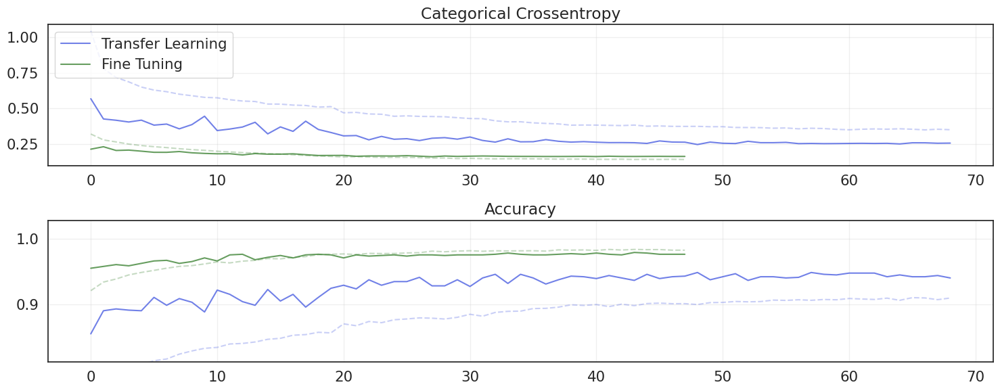

In [ ]:
# Create figure and subplots for loss and accuracy
fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(15, 6))

# Plot categorical cross-entropy loss for both Transfer Learning and Fine Tuning stages
ax1.plot(tl_history['loss'], alpha=0.3, color='#4D61E2', linestyle='--')
ax1.plot(tl_history['val_loss'], label='Transfer Learning', alpha=0.8, color='#4D61E2')
ax1.plot(ft_history['loss'], alpha=0.3, color='#408537', linestyle='--')
ax1.plot(ft_history['val_loss'], label='Fine Tuning', alpha=0.8, color='#408537')
ax1.set_title('Categorical Crossentropy')
ax1.legend(loc='upper left')
ax1.grid(alpha=0.3)

# Plot accuracy for both Transfer Learning and Fine Tuning stages
ax2.plot(tl_history['accuracy'], alpha=0.3, color='#4D61E2', linestyle='--')
ax2.plot(tl_history['val_accuracy'], label='Transfer Learning', alpha=0.8, color='#4D61E2')
ax2.plot(ft_history['accuracy'], alpha=0.3, color='#408537', linestyle='--')
ax2.plot(ft_history['val_accuracy'], label='Fine Tuning', alpha=0.8, color='#408537')
ax2.set_title('Accuracy')
ax2.set_ylim([min(tl_history['val_accuracy']) * 0.95, max(ft_history['val_accuracy']) * 1.05])
ax2.grid(alpha=0.3)

# Adjust layout to prevent overlap and display the plots
plt.tight_layout()
plt.show()

Predictions Shape: (1196, 8)
Accuracy score over the test set: 98.66
Precision score over the test set: 98.679


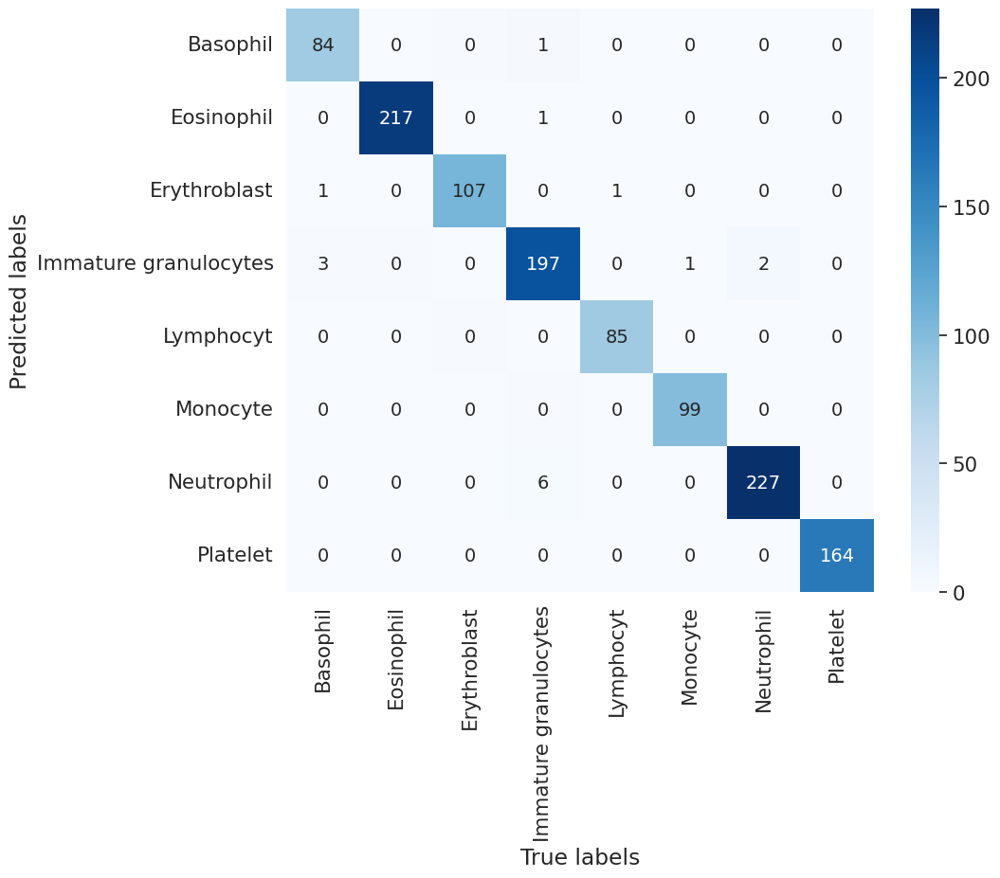

In [ ]:
# Predict labels for the entire plain test set
predictions = ft_model.predict(X_test*255, verbose=0)

# Display the shape of the predictions
print("Predictions Shape:", predictions.shape)

# Convert predictions to class labels
pred_classes = np.argmax(predictions, axis=-1)

# Extract ground truth classes
true_classes = np.argmax(y_test, axis=-1)

# Calculate and display test set accuracy
accuracy = accuracy_score(true_classes, pred_classes)*100
print(f'Accuracy score over the test set: {round(accuracy, 2)}')

# Calculate and display test set precision
precision = precision_score(true_classes, pred_classes, average='weighted')*100
print(f'Precision score over the test set: {round(precision, 4)}')

# Compute the confusion matrix
cm = confusion_matrix(true_classes, pred_classes)

# Combine numbers and percentages into a single string for annotation
annot = np.array([f"{num}" for num in cm.flatten()]).reshape(cm.shape)

# Plot the confusion matrix
plt.figure(figsize=(10, 8))
sns.heatmap(cm.T, annot=annot, fmt='', xticklabels=list(labels.values()), yticklabels=list(labels.values()), cmap='Blues')
plt.xlabel('True labels')
plt.ylabel('Predicted labels')
plt.show()

In [ ]:
import numpy as np
import tensorflow as tf

# set dirt dataset = plain test
X_test_sporco = X_test.copy()
y_test_sporco = y_test.copy()

# set noise standard deviation
white_noise_train_stddev = 0.125  # Valore scelto per il rumore

# Convert y_test labels from one-hot encoded to numerical
y_test_labels = np.argmax(y_test_sporco, axis=1)

# Apply white noise to all test images
for class_label in range(y_test_sporco.shape[1]):
    # Select indexes of current class
    class_indices = np.where(y_test_labels == class_label)[0]

    # Select images of this class
    class_images = X_test_sporco[class_indices]

    # generate white noise for all images
    white_noise = tf.random.normal(
        shape=class_images.shape,
        mean=0.0,
        stddev=white_noise_train_stddev,
        dtype=class_images.dtype
    )

    # Add noise to all class images and clip values between [0, 1]
    X_test_sporco[class_indices] = tf.clip_by_value(class_images + white_noise, clip_value_min=0.0, clip_value_max=1.0)

print("White noise applicato a tutte le immagini del test set per ogni classe.")


White noise applicato a tutte le immagini del test set per ogni classe.


Predictions Shape: (1196, 8)
Accuracy score over the test set: 84.78
Precision score over the test set: 86.9091


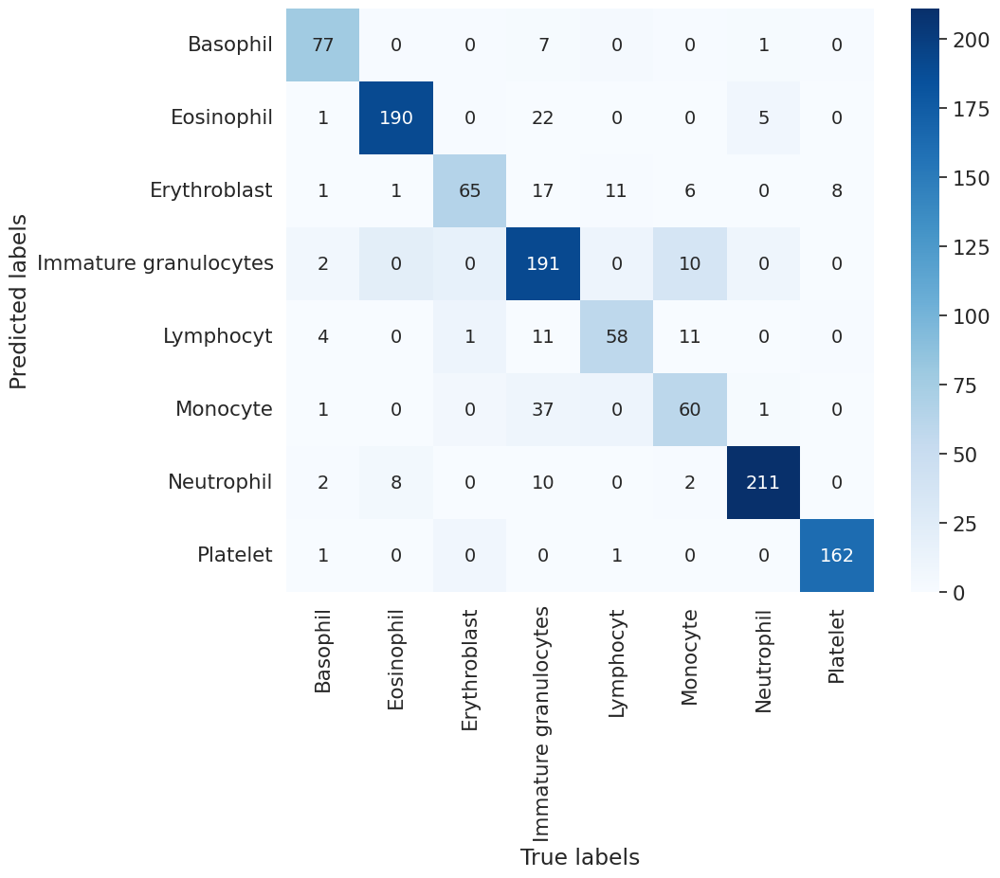

In [ ]:
# Predict labels for the entire test set
predictions = ft_model.predict(X_test_sporco*255, verbose=0)

# Display the shape of the predictions
print("Predictions Shape:", predictions.shape)

# Convert predictions to class labels
pred_classes = np.argmax(predictions, axis=-1)

# Extract ground truth classes
true_classes = np.argmax(y_test_sporco, axis=-1)

# Calculate and display test set accuracy
accuracy = accuracy_score(true_classes, pred_classes)*100
print(f'Accuracy score over the test set: {round(accuracy, 2)}')

# Calculate and display test set precision
precision = precision_score(true_classes, pred_classes, average='weighted')*100
print(f'Precision score over the test set: {round(precision, 4)}')

# Compute the confusion matrix
cm = confusion_matrix(true_classes, pred_classes)

# Combine numbers and percentages into a single string for annotation
annot = np.array([f"{num}" for num in cm.flatten()]).reshape(cm.shape)

# Plot the confusion matrix
plt.figure(figsize=(10, 8))
sns.heatmap(cm.T, annot=annot, fmt='', xticklabels=list(labels.values()), yticklabels=list(labels.values()), cmap='Blues')
plt.xlabel('True labels')
plt.ylabel('Predicted labels')
plt.show()

In [ ]:
%%writefile model.py
import numpy as np

import tensorflow as tf
from tensorflow import keras as tfk
from tensorflow.keras import layers as tfkl


class Model:
    def __init__(self):
        """
        Initialize the internal state of the model. Note that the __init__
        method cannot accept any arguments.

        The following is an example loading the weights of a pre-trained
        model.
        """
        self.neural_network = tfk.models.load_model('Tia.keras')

    def predict(self, X):
        """
        Predict the labels corresponding to the input X. Note that X is a numpy
        array of shape (n_samples, 96, 96, 3) and the output should be a numpy
        array of shape (n_samples,). Therefore, outputs must no be one-hot
        encoded.

        The following is an example of a prediction from the pre-trained model
        loaded in the __init__ method.
        """
        preds = self.neural_network.predict(X)
        if len(preds.shape) == 2:
            preds = np.argmax(preds, axis=1)
        return preds

Writing model.py


In [ ]:
from datetime import datetime
filename = f'submission_{datetime.now().strftime("%y%m%d_%H%M%S")}.zip'

# Add files to the zip command if needed
!zip {filename} model.py Tia.keras

#from google.colab import files
#files.download(filename)

  adding: model.py (deflated 56%)
  adding: Tia.keras (deflated 8%)
